# Visual Inspection

First I will load the required Python Packages. Facebook's Prophet open source forecasting tool will be used to forecast demand in 2019

In [3]:
import pandas as pd
import requests
import pprint 
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import statsmodels.api as sm
from fbprophet import Prophet

In [4]:
# Load csv files into the notebook
jobs = pd.read_csv('jobs.csv')
weather = pd.read_csv('weather.csv')

I will now looks at the dataframes to visually inspect the data I will be analyzing

In [5]:
jobs.head()

,Job Identifier,Organization Id,Job Location City,Job Location Region Code,Job First Upload Complete Datetime,Job Deliverable
0,184830906,10917,Lincoln,NE,9/29/2016 1:39:19 PM,complete
1,184830942,22287,Edmond,OK,9/29/2016 3:02:32 PM,roof
2,184830945,8435,Wichita,KS,9/29/2016 3:05:14 PM,complete
3,184830946,16640,Prairie Village,KS,9/29/2016 3:05:19 PM,roof
4,184830963,8787,Papillion,NE,9/29/2016 3:57:50 PM,complete


In [6]:
jobs.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40307 entries, 0 to 40306
Data columns (total 6 columns):
Job Identifier                        40307 non-null int64
Organization Id                       40307 non-null int64
Job Location City                     40260 non-null object
Job Location Region Code              40307 non-null object
Job First Upload Complete Datetime    40307 non-null object
Job Deliverable                       40307 non-null object
dtypes: int64(2), object(4)
memory usage: 1.8+ MB


In [7]:
weather.head()

,COMMENTS,COUNTY,STATE,LOCATION,LON,LAT,DATE,DATETIME,COMPOSITE_KEY
0,EF1 TORNADO ESTIMATED WIND SPEEDS AROUND 95 MP...,MERCER,PA,2 NNE NEW LEBANON,-80.06,41.44,2019-01-08 00:00:00.000,2019-01-08 16:25:00.000,2019-01-08 16:25:00_41.44_-80.06
1,***PRELIMINARY*** STRUCTURAL DAMAGE HAS OCCURR...,TRUMBULL,OH,1 NNW CORTLAND,-80.73,41.35,2019-01-08 00:00:00.000,2019-01-08 15:20:00.000,2019-01-08 15:20:00_41.35_-80.73
2,DELAYED REPORT OF LARGE TREES DAMAGED AT THE E...,LINCOLN,MO,4 NE TROY,-90.93,39.03,2018-05-03 00:00:00.000,2018-05-03 07:22:00.000,2018-05-03 07:22:00_39.03_-90.93
3,DAMAGE AT AN RV PARK. RV'S BLOWN OFF TIE-DOWNS...,GARZA,TX,4 NE JUSTICEBURG,-101.15,33.08,2018-05-17 00:00:00.000,2018-05-17 23:58:00.000,2018-05-17 23:58:00_33.08_-101.15
4,AT OMAHA EPPLEY AIRFIELD (OAX),DOUGLAS,NE,OMAHA,-96.01,41.26,2018-06-09 00:00:00.000,2018-06-09 09:05:00.000,2018-06-09 09:05:00_41.26_-96.01


In [8]:
weather.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40597 entries, 0 to 40596
Data columns (total 9 columns):
COMMENTS         40597 non-null object
COUNTY           40597 non-null object
STATE            40596 non-null object
LOCATION         40596 non-null object
LON              40597 non-null float64
LAT              40597 non-null float64
DATE             40597 non-null object
DATETIME         40597 non-null object
COMPOSITE_KEY    40597 non-null object
dtypes: float64(2), object(7)
memory usage: 2.8+ MB


One missing State and Location data point. Once the data frame is filtered this may not matter much

# Weather Data Frame Manipulation

I will now begin to filter the weather data fram to remove weather events that have not occurred in cities where contractors have done work.

Additionally, I will only be focusing on events where damage to houses or buildings is mentioned

In [9]:
weather1 = weather.copy()
weather1.head(10)

,COMMENTS,COUNTY,STATE,LOCATION,LON,LAT,DATE,DATETIME,COMPOSITE_KEY
0,EF1 TORNADO ESTIMATED WIND SPEEDS AROUND 95 MP...,MERCER,PA,2 NNE NEW LEBANON,-80.06,41.44,2019-01-08 00:00:00.000,2019-01-08 16:25:00.000,2019-01-08 16:25:00_41.44_-80.06
1,***PRELIMINARY*** STRUCTURAL DAMAGE HAS OCCURR...,TRUMBULL,OH,1 NNW CORTLAND,-80.73,41.35,2019-01-08 00:00:00.000,2019-01-08 15:20:00.000,2019-01-08 15:20:00_41.35_-80.73
2,DELAYED REPORT OF LARGE TREES DAMAGED AT THE E...,LINCOLN,MO,4 NE TROY,-90.93,39.03,2018-05-03 00:00:00.000,2018-05-03 07:22:00.000,2018-05-03 07:22:00_39.03_-90.93
3,DAMAGE AT AN RV PARK. RV'S BLOWN OFF TIE-DOWNS...,GARZA,TX,4 NE JUSTICEBURG,-101.15,33.08,2018-05-17 00:00:00.000,2018-05-17 23:58:00.000,2018-05-17 23:58:00_33.08_-101.15
4,AT OMAHA EPPLEY AIRFIELD (OAX),DOUGLAS,NE,OMAHA,-96.01,41.26,2018-06-09 00:00:00.000,2018-06-09 09:05:00.000,2018-06-09 09:05:00_41.26_-96.01
5,(DMX),STORY,IA,2 S AMES,-93.62,41.99,2018-06-06 00:00:00.000,2018-06-06 22:32:00.000,2018-06-06 22:32:00_41.99_-93.62
6,NUMEROUS REPORTS OF LARGE TREES DOWN ACROSS AR...,WOOD,WV,1 N BOAZ,-81.49,39.39,2018-07-23 00:00:00.000,2018-07-23 23:15:00.000,2018-07-23 23:15:00_39.39_-81.49
7,TREES DOWN IN NORTH CROSSETT. (JAN),ASHLEY,AR,NORTH CROSSETT,-91.94,33.17,2018-04-03 00:00:00.000,2018-04-03 23:00:00.000,2018-04-03 23:00:00_33.17_-91.94
8,AMATEUR RADIO REPORTED AN 18-INCH DIAMETER OAK...,CHESTER,SC,3 W EDGEMOOR,-81.07,34.80,2018-06-27 00:00:00.000,2018-06-27 21:54:00.000,2018-06-27 21:54:00_34.8_-81.07
9,"SEVERAL 5"""" DIAMETER TREE BRANCHES DOWN FROM T...",YAVAPAI,AZ,CORNVILLE,-111.91,34.72,2018-07-28 00:00:00.000,2018-07-28 00:30:00.000,2018-07-28 00:30:00_34.72_-111.91


In [10]:
# Remove weather data that does not occur in states where jobs have been completed
states = jobs['Job Location Region Code'].unique()
weather1 = weather[weather['STATE'].isin(states)]
weather1.STATE.unique()

array(['TX', 'NE', 'SD', 'KS', 'ND', 'OK'], dtype=object)

In [11]:
weather1.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 13333 entries, 3 to 40594
Data columns (total 9 columns):
COMMENTS         13333 non-null object
COUNTY           13333 non-null object
STATE            13333 non-null object
LOCATION         13333 non-null object
LON              13333 non-null float64
LAT              13333 non-null float64
DATE             13333 non-null object
DATETIME         13333 non-null object
COMPOSITE_KEY    13333 non-null object
dtypes: float64(2), object(7)
memory usage: 1.0+ MB


Visually reviewing the data home, building, property, roof, garage, wall, house, residence, shingle looks to be the keywords used when mentioning property damage (houses and buildings)

In [12]:
# Filter for events that mention damage to property
property_damage = ['home','building','property','roof','garage','wall','house','residence','shingle']
pattern = '|'.join(property_damage)
weather2 = weather1[weather1['COMMENTS'].str.lower().str.contains(pattern)]
weather2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 455 entries, 3 to 40367
Data columns (total 9 columns):
COMMENTS         455 non-null object
COUNTY           455 non-null object
STATE            455 non-null object
LOCATION         455 non-null object
LON              455 non-null float64
LAT              455 non-null float64
DATE             455 non-null object
DATETIME         455 non-null object
COMPOSITE_KEY    455 non-null object
dtypes: float64(2), object(7)
memory usage: 35.5+ KB


In [13]:
# Filter the weather data again to only include events that take place where jobs take place
job_cities = jobs['Job Location City'].unique()
citites_pattern = '|'.join(job_cities[0:174])
job_cities

array(['Lincoln', 'Edmond', 'Wichita', ..., 'Linn', 'Concordia',
       'Randall'], dtype=object)

In [14]:
weather3 = weather2[weather2['LOCATION'].str.lower().str.contains(
    citites_pattern, case = False)]
weather3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43 entries, 373 to 40367
Data columns (total 9 columns):
COMMENTS         43 non-null object
COUNTY           43 non-null object
STATE            43 non-null object
LOCATION         43 non-null object
LON              43 non-null float64
LAT              43 non-null float64
DATE             43 non-null object
DATETIME         43 non-null object
COMPOSITE_KEY    43 non-null object
dtypes: float64(2), object(7)
memory usage: 3.4+ KB


In [15]:
# Weather events with property damange and in cities/states with completed jobs
weather3.head(43)

,COMMENTS,COUNTY,STATE,LOCATION,LON,LAT,DATE,DATETIME,COMPOSITE_KEY
373,ROOF BLOWN OFF HOME AT 736 OK 48. ALSO TREE DA...,BRYAN,OK,3 NNE DURANT,-96.37,34.02,2018-03-19 00:00:00.000,2018-03-19 07:01:00.000,2018-03-19 07:01:00_34.02_-96.37
558,DAMAGE TO THE ROOF OF A HOME AND DAMAGE TO A B...,FRANKLIN,TX,7 W ROCKY MOUND,-95.15,33.03,2018-05-23 00:00:00.000,2018-05-23 21:20:00.000,2018-05-23 21:20:00_33.03_-95.15
828,SHINGLES BLOWN OFF ROOF... 1 INCH TREE LIMBS B...,DEUEL,NE,BIG SPRINGS,-102.07,41.06,2018-06-17 00:00:00.000,2018-06-17 20:54:00.000,2018-06-17 20:54:00_41.06_-102.07
1452,"MPING REPORT OF 1"""" TREE LIMBS DOWN AND SHINGL...",OKLAHOMA,OK,2 SE OKLAHOMA CITY,-97.49,35.45,2018-06-07 00:00:00.000,2018-06-07 15:43:00.000,2018-06-07 15:43:00_35.45_-97.49
1836,NO DAMAGE REPORTED...HOWEVER THE WHOLE HOUSE S...,SHERIDAN,NE,10 N HAY SPRINGS,-102.69,42.83,2018-07-25 00:00:00.000,2018-07-25 06:10:00.000,2018-07-25 06:10:00_42.83_-102.69
1926,A LARGE MAPLE TREE WAS UPROOTED... PARTIALLY F...,CANADIAN,OK,YUKON,-97.75,35.50,2018-07-30 00:00:00.000,2018-07-30 08:10:00.000,2018-07-30 08:10:00_35.5_-97.75
2040,STRUCTURAL DAMAGE TO A HOME IN THE MAPLE RIDGE...,TULSA,OK,TULSA,-95.92,36.13,2018-05-03 00:00:00.000,2018-05-03 03:34:00.000,2018-05-03 03:34:00_36.13_-95.92
2160,STRONG THUNDERSTORM WIND DAMAGED THE ROOF OF A...,MAYES,OK,4 W CHOUTEAU,-95.41,36.19,2018-10-09 00:00:00.000,2018-10-09 17:10:00.000,2018-10-09 17:10:00_36.19_-95.41
2284,WINDOWS BROKEN FROM FLYING DEBRIS... AND MINOR...,MONTGOMERY,TX,CONROE,-95.47,30.32,2018-04-14 00:00:00.000,2018-04-14 05:45:00.000,2018-04-14 05:45:00_30.32_-95.47
2858,DELAYED REPORT...TIME-MATCHED TO RADAR. MULTIP...,JOHNSON,KS,2 NW SPRING HILL,-94.85,38.77,2018-10-09 00:00:00.000,2018-10-09 20:40:00.000,2018-10-09 20:40:00_38.77_-94.85


# Weather - find relevant dates and events

In [16]:
weather3.head(43)

,COMMENTS,COUNTY,STATE,LOCATION,LON,LAT,DATE,DATETIME,COMPOSITE_KEY
373,ROOF BLOWN OFF HOME AT 736 OK 48. ALSO TREE DA...,BRYAN,OK,3 NNE DURANT,-96.37,34.02,2018-03-19 00:00:00.000,2018-03-19 07:01:00.000,2018-03-19 07:01:00_34.02_-96.37
558,DAMAGE TO THE ROOF OF A HOME AND DAMAGE TO A B...,FRANKLIN,TX,7 W ROCKY MOUND,-95.15,33.03,2018-05-23 00:00:00.000,2018-05-23 21:20:00.000,2018-05-23 21:20:00_33.03_-95.15
828,SHINGLES BLOWN OFF ROOF... 1 INCH TREE LIMBS B...,DEUEL,NE,BIG SPRINGS,-102.07,41.06,2018-06-17 00:00:00.000,2018-06-17 20:54:00.000,2018-06-17 20:54:00_41.06_-102.07
1452,"MPING REPORT OF 1"""" TREE LIMBS DOWN AND SHINGL...",OKLAHOMA,OK,2 SE OKLAHOMA CITY,-97.49,35.45,2018-06-07 00:00:00.000,2018-06-07 15:43:00.000,2018-06-07 15:43:00_35.45_-97.49
1836,NO DAMAGE REPORTED...HOWEVER THE WHOLE HOUSE S...,SHERIDAN,NE,10 N HAY SPRINGS,-102.69,42.83,2018-07-25 00:00:00.000,2018-07-25 06:10:00.000,2018-07-25 06:10:00_42.83_-102.69
1926,A LARGE MAPLE TREE WAS UPROOTED... PARTIALLY F...,CANADIAN,OK,YUKON,-97.75,35.50,2018-07-30 00:00:00.000,2018-07-30 08:10:00.000,2018-07-30 08:10:00_35.5_-97.75
2040,STRUCTURAL DAMAGE TO A HOME IN THE MAPLE RIDGE...,TULSA,OK,TULSA,-95.92,36.13,2018-05-03 00:00:00.000,2018-05-03 03:34:00.000,2018-05-03 03:34:00_36.13_-95.92
2160,STRONG THUNDERSTORM WIND DAMAGED THE ROOF OF A...,MAYES,OK,4 W CHOUTEAU,-95.41,36.19,2018-10-09 00:00:00.000,2018-10-09 17:10:00.000,2018-10-09 17:10:00_36.19_-95.41
2284,WINDOWS BROKEN FROM FLYING DEBRIS... AND MINOR...,MONTGOMERY,TX,CONROE,-95.47,30.32,2018-04-14 00:00:00.000,2018-04-14 05:45:00.000,2018-04-14 05:45:00_30.32_-95.47
2858,DELAYED REPORT...TIME-MATCHED TO RADAR. MULTIP...,JOHNSON,KS,2 NW SPRING HILL,-94.85,38.77,2018-10-09 00:00:00.000,2018-10-09 20:40:00.000,2018-10-09 20:40:00_38.77_-94.85


In [17]:
weather3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 43 entries, 373 to 40367
Data columns (total 9 columns):
COMMENTS         43 non-null object
COUNTY           43 non-null object
STATE            43 non-null object
LOCATION         43 non-null object
LON              43 non-null float64
LAT              43 non-null float64
DATE             43 non-null object
DATETIME         43 non-null object
COMPOSITE_KEY    43 non-null object
dtypes: float64(2), object(7)
memory usage: 3.4+ KB


In [18]:
# Remove duplicate weather events based on Location and Date
weather4 = weather3.drop_duplicates(['LOCATION','DATE'],keep = 'last')
weather4.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40 entries, 373 to 40367
Data columns (total 9 columns):
COMMENTS         40 non-null object
COUNTY           40 non-null object
STATE            40 non-null object
LOCATION         40 non-null object
LON              40 non-null float64
LAT              40 non-null float64
DATE             40 non-null object
DATETIME         40 non-null object
COMPOSITE_KEY    40 non-null object
dtypes: float64(2), object(7)
memory usage: 3.1+ KB


In [19]:
# With so few city names that are off, I will manually create a dictionary to replace
replace_dict = {'3 NNE DURANT':'DURANT','7 W ROCKY MOUND':'ROCKY MOUND',
                '2 SE OKLAHOMA CITY':'OKLAHOMA CITY','10 N HAY SPRINGS':'HAY SPRINGS',
               '4 W CHOUTEAU':'CHOUTEAU','2 NW SPRING HILL':'SPRING HILL',
               '1 SE BELLEVUE':'BELLEVUE','5 SW CHOUTEAU':'CHOUTEAU',
               '4 N MAYSVILLE':'MAYSVILLE','6 NNE PIERCEVILLE':'PIERCEVILLE',
               '5 NNW LINCOLN':'LINCOLN','3 S LAWTON':'3 S LAWTON',
               '4 N SULPHUR':'SULPHUR','5 NNE LEANDER':'LEANDER',
               '5 WNW LAWTON':'LAWTON','6 SW MIDLAND':'MIDLAND',
                '1 S MISSION DORADO':'MISSION DORADO','1 NNW BISMARCK':'BISMARCK',
               '10 S SHARON SPRINGS':'SHARON SPRINGS','4 N GOODLAND':'GOODLAND'}

In [20]:
# Reformat city names to drop numbers and directional coordinates
weather5 = weather4.copy()
weather5['LOCATION'] = weather5['LOCATION'].replace(replace_dict)
weather5.head()

,COMMENTS,COUNTY,STATE,LOCATION,LON,LAT,DATE,DATETIME,COMPOSITE_KEY
373,ROOF BLOWN OFF HOME AT 736 OK 48. ALSO TREE DA...,BRYAN,OK,DURANT,-96.37,34.02,2018-03-19 00:00:00.000,2018-03-19 07:01:00.000,2018-03-19 07:01:00_34.02_-96.37
558,DAMAGE TO THE ROOF OF A HOME AND DAMAGE TO A B...,FRANKLIN,TX,ROCKY MOUND,-95.15,33.03,2018-05-23 00:00:00.000,2018-05-23 21:20:00.000,2018-05-23 21:20:00_33.03_-95.15
828,SHINGLES BLOWN OFF ROOF... 1 INCH TREE LIMBS B...,DEUEL,NE,BIG SPRINGS,-102.07,41.06,2018-06-17 00:00:00.000,2018-06-17 20:54:00.000,2018-06-17 20:54:00_41.06_-102.07
1452,"MPING REPORT OF 1"""" TREE LIMBS DOWN AND SHINGL...",OKLAHOMA,OK,OKLAHOMA CITY,-97.49,35.45,2018-06-07 00:00:00.000,2018-06-07 15:43:00.000,2018-06-07 15:43:00_35.45_-97.49
1836,NO DAMAGE REPORTED...HOWEVER THE WHOLE HOUSE S...,SHERIDAN,NE,HAY SPRINGS,-102.69,42.83,2018-07-25 00:00:00.000,2018-07-25 06:10:00.000,2018-07-25 06:10:00_42.83_-102.69


In [21]:
# Create a city/state key for weather data
weather5['city_state'] = weather5['LOCATION'].str.lower()+weather5['STATE'].str.lower()
weather5.head()

,COMMENTS,COUNTY,STATE,LOCATION,LON,LAT,DATE,DATETIME,COMPOSITE_KEY,city_state
373,ROOF BLOWN OFF HOME AT 736 OK 48. ALSO TREE DA...,BRYAN,OK,DURANT,-96.37,34.02,2018-03-19 00:00:00.000,2018-03-19 07:01:00.000,2018-03-19 07:01:00_34.02_-96.37,durantok
558,DAMAGE TO THE ROOF OF A HOME AND DAMAGE TO A B...,FRANKLIN,TX,ROCKY MOUND,-95.15,33.03,2018-05-23 00:00:00.000,2018-05-23 21:20:00.000,2018-05-23 21:20:00_33.03_-95.15,rocky moundtx
828,SHINGLES BLOWN OFF ROOF... 1 INCH TREE LIMBS B...,DEUEL,NE,BIG SPRINGS,-102.07,41.06,2018-06-17 00:00:00.000,2018-06-17 20:54:00.000,2018-06-17 20:54:00_41.06_-102.07,big springsne
1452,"MPING REPORT OF 1"""" TREE LIMBS DOWN AND SHINGL...",OKLAHOMA,OK,OKLAHOMA CITY,-97.49,35.45,2018-06-07 00:00:00.000,2018-06-07 15:43:00.000,2018-06-07 15:43:00_35.45_-97.49,oklahoma cityok
1836,NO DAMAGE REPORTED...HOWEVER THE WHOLE HOUSE S...,SHERIDAN,NE,HAY SPRINGS,-102.69,42.83,2018-07-25 00:00:00.000,2018-07-25 06:10:00.000,2018-07-25 06:10:00_42.83_-102.69,hay springsne


In [22]:
# Create dummy variables to represent when each job type is completed
dummy_jobs = pd.get_dummies(jobs['Job Deliverable'])
dummy_jobs.head()

,Total Living Area,Total Living Area Plus,complete,roof,roof_estimate
0,0,0,1,0,0
1,0,0,0,1,0
2,0,0,1,0,0
3,0,0,0,1,0
4,0,0,1,0,0


In [23]:
# Combine dummy variable data frame to master df
# Include a column of 1 for every job completed, independent of type
jobs1 = pd.concat([jobs, dummy_jobs],axis = 1)
jobs1['job_done'] = 1
jobs1.head()

,Job Identifier,Organization Id,Job Location City,Job Location Region Code,Job First Upload Complete Datetime,Job Deliverable,Total Living Area,Total Living Area Plus,complete,roof,roof_estimate,job_done
0,184830906,10917,Lincoln,NE,9/29/2016 1:39:19 PM,complete,0,0,1,0,0,1
1,184830942,22287,Edmond,OK,9/29/2016 3:02:32 PM,roof,0,0,0,1,0,1
2,184830945,8435,Wichita,KS,9/29/2016 3:05:14 PM,complete,0,0,1,0,0,1
3,184830946,16640,Prairie Village,KS,9/29/2016 3:05:19 PM,roof,0,0,0,1,0,1
4,184830963,8787,Papillion,NE,9/29/2016 3:57:50 PM,complete,0,0,1,0,0,1


In [24]:
# Date field is currently a string, need to change it to a datetime object
jobs1['Job First Upload Complete Datetime'] = pd.to_datetime(jobs1['Job First Upload Complete Datetime'])
jobs1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 40307 entries, 0 to 40306
Data columns (total 12 columns):
Job Identifier                        40307 non-null int64
Organization Id                       40307 non-null int64
Job Location City                     40260 non-null object
Job Location Region Code              40307 non-null object
Job First Upload Complete Datetime    40307 non-null datetime64[ns]
Job Deliverable                       40307 non-null object
Total Living Area                     40307 non-null uint8
Total Living Area Plus                40307 non-null uint8
complete                              40307 non-null uint8
roof                                  40307 non-null uint8
roof_estimate                         40307 non-null uint8
job_done                              40307 non-null int64
dtypes: datetime64[ns](1), int64(3), object(3), uint8(5)
memory usage: 2.3+ MB


In [25]:
# Create a city/state key for job data
job_weather = jobs1.copy()
job_weather['city_state'] = job_weather['Job Location City'].str.lower()+job_weather['Job Location Region Code'].str.lower()
job_weather.rename(columns = {'Job Identifier':'job_id'},inplace=True)
job_weather.head()

,job_id,Organization Id,Job Location City,Job Location Region Code,Job First Upload Complete Datetime,Job Deliverable,Total Living Area,Total Living Area Plus,complete,roof,roof_estimate,job_done,city_state
0,184830906,10917,Lincoln,NE,2016-09-29 13:39:19,complete,0,0,1,0,0,1,lincolnne
1,184830942,22287,Edmond,OK,2016-09-29 15:02:32,roof,0,0,0,1,0,1,edmondok
2,184830945,8435,Wichita,KS,2016-09-29 15:05:14,complete,0,0,1,0,0,1,wichitaks
3,184830946,16640,Prairie Village,KS,2016-09-29 15:05:19,roof,0,0,0,1,0,1,prairie villageks
4,184830963,8787,Papillion,NE,2016-09-29 15:57:50,complete,0,0,1,0,0,1,papillionne


In [26]:
job_weather.rename(columns = {'Job First Upload Complete Datetime':'job_date'},inplace=True)

In [27]:
# Update DATE to datetime
from datetime import timedelta
weather5['DATE'] = pd.to_datetime(weather5['DATE'])

# Add lower and upper bounds to event dates 
# Create a job completed window

# Soonest appointment is day after event
weather5['DATE_L'] = weather5[['DATE']] + timedelta(days = 1)
# Latest appointment if there was damage would be two weeks after
weather5['DATE_H'] = weather5[['DATE']] + timedelta(days = 30)

weather5['event_y_n'] = 1

weather5.head()

,COMMENTS,COUNTY,STATE,LOCATION,LON,LAT,DATE,DATETIME,COMPOSITE_KEY,city_state,DATE_L,DATE_H,event_y_n
373,ROOF BLOWN OFF HOME AT 736 OK 48. ALSO TREE DA...,BRYAN,OK,DURANT,-96.37,34.02,2018-03-19,2018-03-19 07:01:00.000,2018-03-19 07:01:00_34.02_-96.37,durantok,2018-03-20,2018-04-18,1
558,DAMAGE TO THE ROOF OF A HOME AND DAMAGE TO A B...,FRANKLIN,TX,ROCKY MOUND,-95.15,33.03,2018-05-23,2018-05-23 21:20:00.000,2018-05-23 21:20:00_33.03_-95.15,rocky moundtx,2018-05-24,2018-06-22,1
828,SHINGLES BLOWN OFF ROOF... 1 INCH TREE LIMBS B...,DEUEL,NE,BIG SPRINGS,-102.07,41.06,2018-06-17,2018-06-17 20:54:00.000,2018-06-17 20:54:00_41.06_-102.07,big springsne,2018-06-18,2018-07-17,1
1452,"MPING REPORT OF 1"""" TREE LIMBS DOWN AND SHINGL...",OKLAHOMA,OK,OKLAHOMA CITY,-97.49,35.45,2018-06-07,2018-06-07 15:43:00.000,2018-06-07 15:43:00_35.45_-97.49,oklahoma cityok,2018-06-08,2018-07-07,1
1836,NO DAMAGE REPORTED...HOWEVER THE WHOLE HOUSE S...,SHERIDAN,NE,HAY SPRINGS,-102.69,42.83,2018-07-25,2018-07-25 06:10:00.000,2018-07-25 06:10:00_42.83_-102.69,hay springsne,2018-07-26,2018-08-24,1


A weather event is attributed if the weather event: 

1) Caused damage to property (as described)

2) Happened in the same city/state as the job

3) The job took place at most 30 days after the weather event  

In [28]:
# Create a new data frame that contains a job id and if a weather event happened

import pandasql as ps

sql_code = '''
      SELECT 
          job_weather.job_id,
          weather5.event_y_n
      FROM job_weather
      JOIN weather5 ON weather5.city_state = job_weather.city_state
          AND (job_weather.job_date BETWEEN weather5.DATE_L AND weather5.DATE_H)
      '''

df_key = ps.sqldf(sql_code, locals())
df_key.info(), df_key.head()    

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 161 entries, 0 to 160
Data columns (total 2 columns):
job_id       161 non-null int64
event_y_n    161 non-null int64
dtypes: int64(2)
memory usage: 2.6 KB


(None,       job_id  event_y_n
 0  185268926          1
 1  185273557          1
 2  185273712          1
 3  185295850          1
 4  185296497          1)

In [29]:
# Add weather event variable to jobs data frame
df_key.rename(columns = {'event_y_n':'weather_event'},inplace= True)

job_weather1 = job_weather.copy()
job_weather2 = pd.merge(job_weather1,df_key, on = 'job_id',how='left', indicator=True)
job_weather2.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40307 entries, 0 to 40306
Data columns (total 15 columns):
job_id                      40307 non-null int64
Organization Id             40307 non-null int64
Job Location City           40260 non-null object
Job Location Region Code    40307 non-null object
job_date                    40307 non-null datetime64[ns]
Job Deliverable             40307 non-null object
Total Living Area           40307 non-null uint8
Total Living Area Plus      40307 non-null uint8
complete                    40307 non-null uint8
roof                        40307 non-null uint8
roof_estimate               40307 non-null uint8
job_done                    40307 non-null int64
city_state                  40260 non-null object
weather_event               161 non-null float64
_merge                      40307 non-null category
dtypes: category(1), datetime64[ns](1), float64(1), int64(3), object(4), uint8(5)
memory usage: 3.3+ MB


In [30]:
# Remove all colums but job done, date, and weather event
job_weather3 = job_weather2[['job_date','job_done','weather_event']]
job_weather3.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40307 entries, 0 to 40306
Data columns (total 3 columns):
job_date         40307 non-null datetime64[ns]
job_done         40307 non-null int64
weather_event    161 non-null float64
dtypes: datetime64[ns](1), float64(1), int64(1)
memory usage: 1.2 MB


In [31]:
# Sum of potentially weather related jobs in 2018
job_weather_sum = job_weather3.groupby(job_weather3.job_date.dt.year).sum()
job_weather_sum

,job_done,weather_event
job_date,,
2016,675,0.0
2017,9720,0.0
2018,25279,161.0
2019,4633,0.0


Archive Code (Below)

In [32]:
#job_weather3_2018 = job_weather3[job_weather3['job_date'] > '2017-12-31']
#job_weather3_2018 = job_weather3_2018[job_weather3_2018['job_date'] < '2019-01-01']
#job_weather_sum_18 = job_weather3_2018.groupby(job_weather3.job_date.dt.month).sum()
#job_weather_sum_18

In [33]:
# Calculate percentage of jobs caused by weather events, by month in 2018
#job_weather_sum_18['percent'] = job_weather_sum_18['weather_event']/job_weather_sum_18['job_done']
#job_weather_sum_18

In [34]:
# Calculate 2019 jobs that will be caused by weather
#forecast_19_weather = forecast_19.copy()
#forecast_19_weather1 = forecast_19_weather.groupby(forecast_19_weather.day.dt.month).sum()
#forecast_19_weather1

In [35]:
# Join data frames to get 2019 forecast and 2018 % of weather jobs
#forecast_19_weather2 = forecast_19_weather1.join(job_weather_sum_18['percent'])
#forecast_19_weather2

In [36]:
# Calculate 2019 jobs that will be caused by weather
#forecast_19_weather3 = forecast_19_weather2.copy()
#forecast_19_weather3['Job bc Weather'] = forecast_19_weather3['Jobs Done'] * forecast_19_weather3['percent']
#forecast_19_weather3['Job bc Weather'] = forecast_19_weather3['Job bc Weather'].round()
#forecast_19_weather3

In [37]:
#weather_jobs = forecast_19_weather3[['Job bc Weather']]
#weather_jobs.plot(kind='bar')
#plt.xlabel('Month in 2019')
#plt.ylabel('Jobs Done Caused by Weather')

In [38]:
#print('Jobs Forecasted in 2019 bc of Weather: %f' % weather_jobs[['Job bc Weather']].sum() )

Archive Code (Above)

In [39]:
# 'Holiday' window ==> +30 days for a job to be completed

# Remove all data from weather data frame except for dates
weather_event = weather5[['DATE']]
weather_event.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 40 entries, 373 to 40367
Data columns (total 1 columns):
DATE    40 non-null datetime64[ns]
dtypes: datetime64[ns](1)
memory usage: 640.0 bytes


In [40]:
# Turn date data frame to array
weather_event1 = weather_event.DATE.to_numpy()
weather_event1

array(['2018-03-19T00:00:00.000000000', '2018-05-23T00:00:00.000000000',
       '2018-06-17T00:00:00.000000000', '2018-06-07T00:00:00.000000000',
       '2018-07-25T00:00:00.000000000', '2018-07-30T00:00:00.000000000',
       '2018-10-09T00:00:00.000000000', '2018-04-14T00:00:00.000000000',
       '2018-10-09T00:00:00.000000000', '2018-06-02T00:00:00.000000000',
       '2018-08-19T00:00:00.000000000', '2018-04-14T00:00:00.000000000',
       '2018-05-20T00:00:00.000000000', '2018-05-03T00:00:00.000000000',
       '2018-06-18T00:00:00.000000000', '2018-07-30T00:00:00.000000000',
       '2018-09-20T00:00:00.000000000', '2018-06-07T00:00:00.000000000',
       '2018-04-04T00:00:00.000000000', '2018-08-10T00:00:00.000000000',
       '2018-08-16T00:00:00.000000000', '2018-06-09T00:00:00.000000000',
       '2018-07-04T00:00:00.000000000', '2018-07-18T00:00:00.000000000',
       '2018-05-15T00:00:00.000000000', '2018-03-18T00:00:00.000000000',
       '2018-07-04T00:00:00.000000000', '2018-10-13

In [41]:
weather_window = pd.DataFrame({'holiday':'weather','ds':weather_event1,
                              'lower_window':-14, 'upper_window':14})
weather_window.head()

,holiday,ds,lower_window,upper_window
0,weather,2018-03-19,-14,14
1,weather,2018-05-23,-14,14
2,weather,2018-06-17,-14,14
3,weather,2018-06-07,-14,14
4,weather,2018-07-25,-14,14


# Forecast total jobs for 2019

What are the total jobs forecasted in 2019?

In [42]:
# Sum jobs by day
period = jobs1['Job First Upload Complete Datetime'].dt.to_period("D")
job_count = jobs1.groupby(period)
job_count1 = job_count.sum()
job_count2 = job_count1[['job_done']]
job_count3 = job_count2.reset_index()
job_count3.rename(columns = {'Job First Upload Complete Datetime':'day'}, inplace = True)
job_count3.head(10)

,day,job_done
0,2016-09-29,9
1,2016-09-30,9
2,2016-10-01,8
3,2016-10-02,3
4,2016-10-03,9
5,2016-10-04,12
6,2016-10-05,14
7,2016-10-06,7
8,2016-10-07,10
9,2016-10-08,4


In [43]:
# Update 'day' from period to datetime
job_count3.day = job_count3.day.dt.to_timestamp()

In [44]:
job_count3.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878 entries, 0 to 877
Data columns (total 2 columns):
day         878 non-null datetime64[ns]
job_done    878 non-null int64
dtypes: datetime64[ns](1), int64(1)
memory usage: 13.8 KB


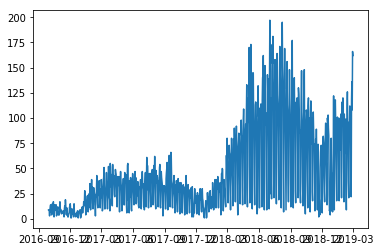

In [45]:
x = job_count3[['day']]
y = job_count3[['job_done']]
plt.plot(x,y)
plt.show()

In [46]:
# Rename columns to ds and y for Phrophet analysis
job_count4 = job_count3.copy()
job_count4.rename(columns = {'day':'ds','job_done':'y'},inplace = True)
job_count4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878 entries, 0 to 877
Data columns (total 2 columns):
ds    878 non-null datetime64[ns]
y     878 non-null int64
dtypes: datetime64[ns](1), int64(1)
memory usage: 13.8 KB


In [47]:
# Fit the model to the dataset
m = Prophet()
m.fit(job_count4)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [48]:
# Create forecast data frame with dates going out to the end of 2019
future = m.make_future_dataframe(periods = 305)
future.tail()

,ds
1178,2019-12-27
1179,2019-12-28
1180,2019-12-29
1181,2019-12-30
1182,2019-12-31


In [49]:
# Run prediction model on historical data for future dates
forecast = m.predict(future)
forecast[['ds','yhat','yhat_lower','yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1178,2019-12-27,95.256036,66.433134,122.948634
1179,2019-12-28,65.416334,37.593297,92.215205
1180,2019-12-29,50.070134,22.695452,78.612651
1181,2019-12-30,91.506361,62.208061,119.123866
1182,2019-12-31,102.665076,73.719554,130.182083


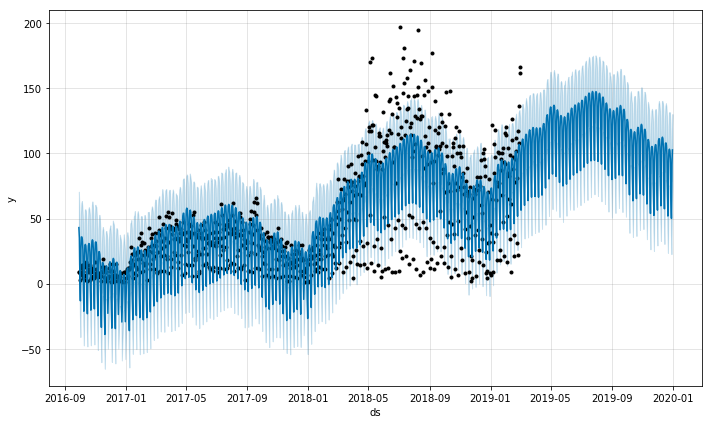

In [50]:
# Plot forecast and actuals
fig1 = m.plot(forecast)

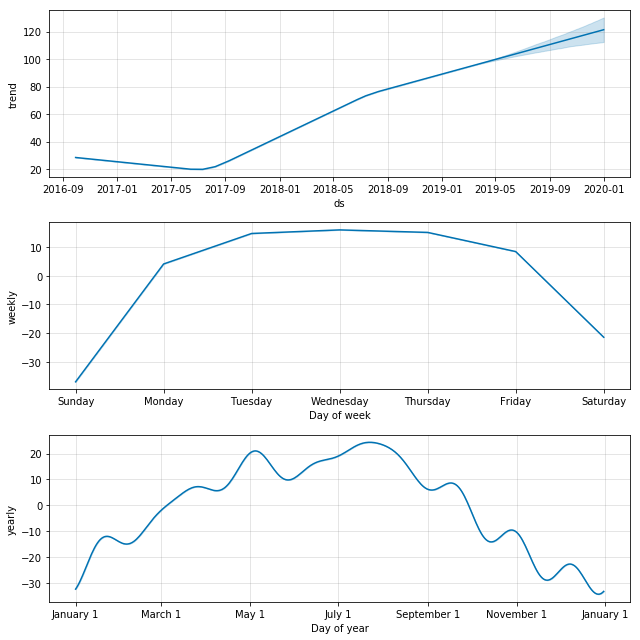

In [51]:
# Seasonality and trend graphs
fig2 = m.plot_components(forecast)

In [52]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

fig_plotly = plot_plotly(m, forecast)
py.iplot(fig_plotly)

In [53]:
# Calculate the root mean squared error to see how far off predictions are
print('RMSE: %f' % np.sqrt(np.mean((forecast.loc[:878, 'yhat']-job_count4['y'])**2)) )

RMSE: 21.088889


I will now rerun the Phrophet forecast, but this time I will be passing mothly seasonality to see if there is a better fit than the default

In [54]:
m1 = Prophet(weekly_seasonality=False)
m1.add_seasonality(name='monthly',period=30.5, fourier_order=5)
m1.fit(job_count4)
future1 = m1.make_future_dataframe(periods=305)
forecast1 = m1.predict(future1)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


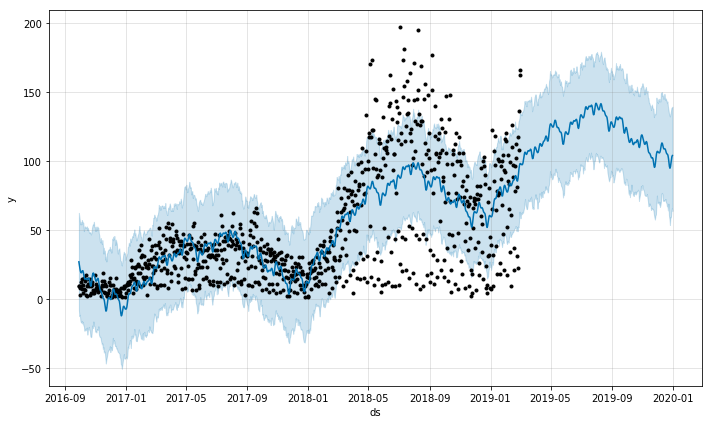

In [55]:
fig1_2 = m1.plot(forecast1)

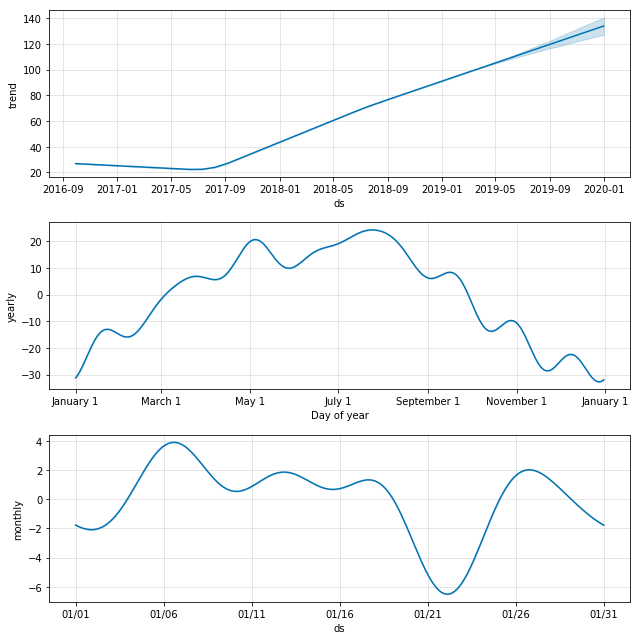

In [56]:
fig2_2 = m1.plot_components(forecast1)

In [57]:
py.init_notebook_mode()

fig_plotly2 = plot_plotly(m1, forecast1)
py.iplot(fig_plotly2)

In [58]:
# cal root mean square erroe
print('RMSE: %f' % np.sqrt(np.mean((forecast1.loc[:878, 'yhat']-job_count4['y'])**2)) )

RMSE: 28.566619


The RMSE is higher for the monthly Phorphet forecast, therefore I will be using the first set of results to forecast demand in 2019

In [59]:
# Return only future data
forecast_only = forecast[forecast['ds']>'2019-03-01']
forecast_only1 = forecast_only[['ds','yhat']]
forecast_only1.rename(columns = {'ds':'day','yhat':'job_done'},inplace = True)

/Users/chrismorehouse/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [60]:
frame = [job_count3,forecast_only1]
forecast_19 = pd.concat(frame)
forecast_19.tail(), forecast_19.head()

(            day    job_done
 1178 2019-12-27   95.256036
 1179 2019-12-28   65.416334
 1180 2019-12-29   50.070134
 1181 2019-12-30   91.506361
 1182 2019-12-31  102.665076,          day  job_done
 0 2016-09-29       9.0
 1 2016-09-30       9.0
 2 2016-10-01       8.0
 3 2016-10-02       3.0
 4 2016-10-03       9.0)

In [61]:
forecast_19 = forecast_19[forecast_19['day']>'2018-12-31']
forecast_19.head()

,day,job_done
818,2019-01-01,7.0
819,2019-01-02,39.0
820,2019-01-03,65.0
821,2019-01-04,122.0
822,2019-01-05,32.0


Text(0,0.5,'Jobs Done')

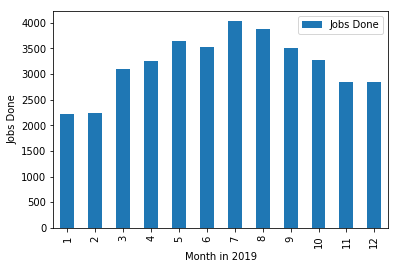

In [62]:
forecast_19.rename(columns = {'job_done':'Jobs Done'},inplace = True)
forecast_19.groupby(forecast_19.day.dt.month).sum().plot(kind='bar')
plt.xlabel('Month in 2019')
plt.ylabel('Jobs Done')

In [63]:
print('Jobs Forecasted in 2019: %f' % forecast_19[['Jobs Done']].sum() )

Jobs Forecasted in 2019: 38390.009228


In [64]:
# Mean daily jobs in historical data
job_count3['job_done'].mean()

45.90774487471526

# Logistic Normalization on Total Jobs

In [65]:
job_count4.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878 entries, 0 to 877
Data columns (total 2 columns):
ds    878 non-null datetime64[ns]
y     878 non-null int64
dtypes: datetime64[ns](1), int64(1)
memory usage: 13.8 KB


Disregarding capacity, removing logistic growth curve

In [66]:
# Capacity would be households of the states where the data is collected 
# US housing units
US_h = 138000000

# US population
US_p = 330744054

#US housing to Us pop
US_rate = 138000000/330744054

# State population
NE_p = 1929268
OK_p = 3943079
KS_p = 2911505
TX_p = 28701845
ND_p = 760077
SD_p = 882235

# State housing
NE_h = NE_p * US_rate
OK_h = OK_p * US_rate
KS_h = KS_p * US_rate
TX_h = TX_p * US_rate
ND_h = ND_p * US_rate
SD_h = SD_p * US_rate

numbers = [NE_h,OK_h,KS_h,TX_h,ND_h,SD_h]

# Capacity 
cap = sum(numbers)
print(cap)

16325811.988747045


In [67]:
# Log transform to normalize data, reduce noise
job_count_log = job_count4.copy()
job_count_log['y'] = np.log(job_count_log['y'])
# job_count_log['cap'] = np.log(cap)

# Fit the model to the dataset
# Add weather events as holidays
#ml = Prophet(growth='logistic', holidays = weather_window)
ml = Prophet(holidays = weather_window)
ml.fit(job_count_log)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [68]:
# Create forecast data frame with dates going out to the end of 2019
futurel = ml.make_future_dataframe(periods = 305)
#futurel['cap'] = np.log(cap)
futurel.tail()


,ds
1178,2019-12-27
1179,2019-12-28
1180,2019-12-29
1181,2019-12-30
1182,2019-12-31


In [69]:
# Run prediction model on historical data for future dates
forecastl = ml.predict(futurel)
forecastl[['ds','yhat','yhat_lower','yhat_upper']].tail()

,ds,yhat,yhat_lower,yhat_upper
1178,2019-12-27,4.527115,3.954388,5.099362
1179,2019-12-28,3.820724,3.265796,4.392064
1180,2019-12-29,3.015517,2.468094,3.603193
1181,2019-12-30,4.458486,3.906351,5.035127
1182,2019-12-31,4.688125,4.071546,5.285127


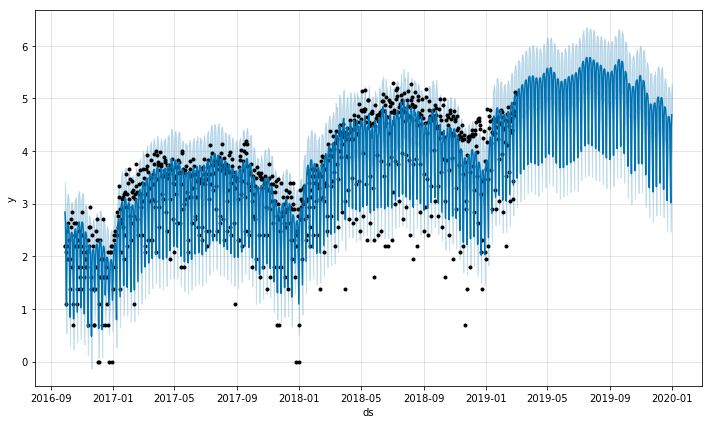

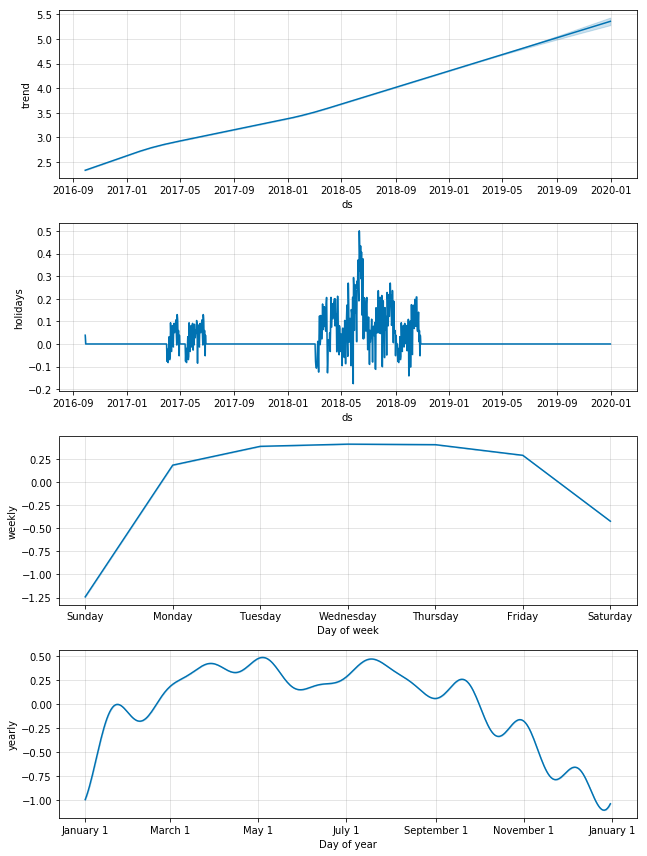

In [70]:
# Plot forecast and actuals
fig1l = ml.plot(forecastl)

# Seasonality and trend graphs
fig2l = ml.plot_components(forecastl)

In [71]:
# Log graph
py.init_notebook_mode()

fig_plotlyl = plot_plotly(ml, forecastl)
py.iplot(fig_plotlyl)

In [72]:
# Recalculate values as original variables (exp data frame)
forecastl2 = forecastl.copy()
forecastl2[['yhat','yhat_lower','yhat_upper']] = np.exp(forecastl2[['yhat','yhat_lower','yhat_upper']])

# Calculate the root mean squared error to see how far off predictions are
print('RMSE: %f' % np.sqrt(np.mean((forecastl2.loc[:878, 'yhat']-job_count4['y'])**2)) )

RMSE: 17.500913


In [73]:
# Return only future data
forecast_only_log = forecastl2[forecastl2['ds']>'2019-03-01']
forecast_only_log1 = forecast_only_log[['ds','yhat']]
forecast_only_log1.rename(columns = {'ds':'day','yhat':'job_done'},inplace = True)

frame_log = [job_count3,forecast_only_log1]
forecast_19_log = pd.concat(frame_log)
forecast_19_log.tail(), forecast_19_log.head()


/Users/chrismorehouse/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



(            day    job_done
 1178 2019-12-27   92.491292
 1179 2019-12-28   45.637250
 1180 2019-12-29   20.399641
 1181 2019-12-30   86.356652
 1182 2019-12-31  108.649226,          day  job_done
 0 2016-09-29       9.0
 1 2016-09-30       9.0
 2 2016-10-01       8.0
 3 2016-10-02       3.0
 4 2016-10-03       9.0)

In [74]:
forecast_19_log1 = forecast_19_log[forecast_19_log['day']>'2018-12-31']
forecast_19_log1.head()

,day,job_done
818,2019-01-01,7.0
819,2019-01-02,39.0
820,2019-01-03,65.0
821,2019-01-04,122.0
822,2019-01-05,32.0


/Users/chrismorehouse/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



Text(0,0.5,'Jobs Done')

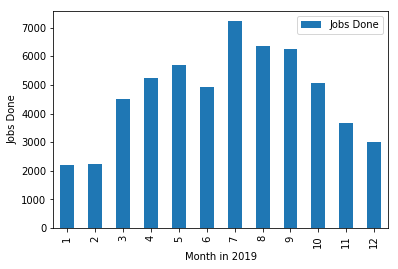

In [75]:
forecast_19_log1.rename(columns = {'job_done':'Jobs Done'},inplace = True)
forecast_19_log1.groupby(forecast_19_log1.day.dt.month).sum().plot(kind='bar')
plt.xlabel('Month in 2019')
plt.ylabel('Jobs Done')

In [76]:
# determine impact of weather on 2019 forecast
# exp holiday impact

holidays_norm = forecastl.copy()
holidays_norm['holidays'] = np.exp(holidays_norm['holidays'])
holidays_norm2 = holidays_norm[['ds','holidays']]
holidays_norm2.replace(1,0,inplace = True)
holidays_norm2.head()

/Users/chrismorehouse/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4042: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



,ds,holidays
0,2016-09-29,1.039575
1,2016-09-30,0.000000
2,2016-10-01,0.000000
3,2016-10-02,0.000000
4,2016-10-03,0.000000


In [77]:
# Group holiday impact by month for historical data
holidays_norm3 = holidays_norm2[holidays_norm2['ds']<'2019-03-02']
job_count3_weather = job_count3.copy()
job_count3_weather['holiday_impact'] = holidays_norm3['holidays']


job_count3_weather.head()

,day,job_done,holiday_impact
0,2016-09-29,9,1.039575
1,2016-09-30,9,0.000000
2,2016-10-01,8,0.000000
3,2016-10-02,3,0.000000
4,2016-10-03,9,0.000000


How many jobs are caused by weather events in 2019?

Text(0,0.5,'Jobs Done bc Weather')

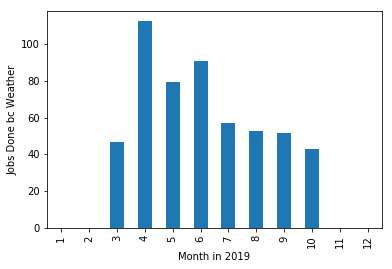

In [78]:
# Calculate the impact of weather events by month of the year
weather_impact_day = job_count3_weather.groupby(job_count3_weather.day.dt.month).sum()
weather_impact_day['percent'] = weather_impact_day['holiday_impact']/weather_impact_day['job_done']
weather_impact_day

forecast_19w_mo = forecast_19_log1.groupby(forecast_19_log1.day.dt.month).sum() 
forecast_19w_mo['weather_per'] = weather_impact_day['percent']
forecast_19w_mo['weather_jobs'] = forecast_19w_mo['weather_per']*forecast_19w_mo['Jobs Done']
forecast_19w_mo

forecast_19w_mo.rename(columns = {'weather_jobs':'Jobs Done bc Weather'},inplace = True)
forecast_19w_mo['Jobs Done bc Weather'].plot(kind='bar')
plt.xlabel('Month in 2019')
plt.ylabel('Jobs Done bc Weather')

In [79]:
print('Jobs Forecasted in 2019 bc of Weather: %f' % forecast_19w_mo[['Jobs Done bc Weather']].sum() )

Jobs Forecasted in 2019 bc of Weather: 532.910641


In [80]:
print('Jobs Forecasted in 2019 factoring in Weather: %f' % forecast_19_log1[['Jobs Done']].sum() )

Jobs Forecasted in 2019 factoring in Weather: 56438.608613


In [81]:
# Jobs done in 2019 by Month
forecast_19_log1.groupby(forecast_19_log1.day.dt.month).sum()

,Jobs Done
day,
1,2220.000000
2,2251.000000
3,4519.646427
4,5229.486384
5,5690.461598
6,4937.291261
7,7236.119842
8,6372.044946
9,6242.805375


# Forecast roof job and complete job demand

What are the roof and complete jobs forecasted in 2019?

In [82]:
job_count1.head() 

,Job Identifier,Organization Id,Total Living Area,Total Living Area Plus,complete,roof,roof_estimate,job_done
Job First Upload Complete Datetime,,,,,,,,
2016-09-29,1663478966,131340,0,0,5,4,0,9
2016-09-30,1663482255,148185,0,0,4,5,0,9
2016-10-01,1478653132,141692,0,0,5,3,0,8
2016-10-02,554495761,45547,0,0,3,0,0,3
2016-10-03,1663489111,121363,0,0,6,3,0,9


In [83]:
# Create a data frame of just completed job summations, daily
job_count_split = job_count1[['job_done','roof','complete']]
job_count_split1 = job_count_split.reset_index()
job_count_split1.rename(columns = {'Job First Upload Complete Datetime':'day'}, inplace = True)
job_count_split1.head(10)

,day,job_done,roof,complete
0,2016-09-29,9,4,5
1,2016-09-30,9,5,4
2,2016-10-01,8,3,5
3,2016-10-02,3,0,3
4,2016-10-03,9,3,6
5,2016-10-04,12,6,6
6,2016-10-05,14,5,9
7,2016-10-06,7,2,5
8,2016-10-07,10,2,8
9,2016-10-08,4,1,3


In [84]:
# change Day column to a timestamp
job_count_split1.day = job_count_split1.day.dt.to_timestamp()
job_count_split1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878 entries, 0 to 877
Data columns (total 4 columns):
day         878 non-null datetime64[ns]
job_done    878 non-null int64
roof        878 non-null uint8
complete    878 non-null uint8
dtypes: datetime64[ns](1), int64(1), uint8(2)
memory usage: 15.5 KB


In [85]:
# create two data frames, one for roof jobs and one for complete
roof_jobs = job_count_split1[['day','roof']]
complete_jobs = job_count_split1[['day','complete']]

In [86]:
# prepare roof jobs data frame for prophet model
roof_jobs1 = roof_jobs
roof_jobs1.rename(columns = {'day':'ds','roof':'y'},inplace = True)
roof_jobs1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878 entries, 0 to 877
Data columns (total 2 columns):
ds    878 non-null datetime64[ns]
y     878 non-null uint8
dtypes: datetime64[ns](1), uint8(1)
memory usage: 7.8 KB


/Users/chrismorehouse/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [87]:
# prepare complete jobs data frame for prophet model
complete_jobs1 = complete_jobs
complete_jobs1.rename(columns = {'day':'ds','roof':'y'},inplace = True)
complete_jobs1.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 878 entries, 0 to 877
Data columns (total 2 columns):
ds          878 non-null datetime64[ns]
complete    878 non-null uint8
dtypes: datetime64[ns](1), uint8(1)
memory usage: 7.8 KB


/Users/chrismorehouse/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



# Roof forecast

Since I've forecasted total jobs, I will be including it (and its forecast) as an extra regressor for forecasting roof and complete.

I first forecasted the total, and then will use it as an extra regressor when I forecast each of the subgroups (roof and complete). Because the total has more data, it is easier to forecast and could improve the subgroup forecast.

Running Prophet on log(roof) yielded a much higher error rate, therefore I will not be normalizing the data

In [88]:
# Creating additional regressors
# (UNDONE) Log normalization of regressor
forecast_regressor = forecastl[forecastl['ds']>'2019-03-01']
forecast_regressor1 = forecast_regressor[['ds','yhat']]
forecast_regressor1.head()

,ds,yhat
878,2019-03-02,4.288444
879,2019-03-03,3.485716
880,2019-03-04,4.922958
881,2019-03-05,5.138858
882,2019-03-06,5.174554


In [89]:
# Change regressor back to normal units
job_count5 = job_count4.copy()
job_count5.rename(columns = {'y':'reg'},inplace = True)
forecast_regressor2 = forecast_regressor1
forecast_regressor2.rename(columns = {'yhat':'reg'}, inplace = True)
forecast_regressor2['reg'] = np.exp(forecast_regressor2['reg'])
forecast_regressor2.rename(columns = {'yhat':'reg'},inplace = True)
job_count5.head(),forecast_regressor2.head()

/Users/chrismorehouse/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy

/Users/chrismorehouse/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:6: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



(          ds  reg
 0 2016-09-29    9
 1 2016-09-30    9
 2 2016-10-01    8
 3 2016-10-02    3
 4 2016-10-03    9,             ds         reg
 878 2019-03-02   72.853034
 879 2019-03-03   32.645809
 880 2019-03-04  137.408424
 881 2019-03-05  170.520924
 882 2019-03-06  176.717769)

In [90]:
# combining regressors and 
frames = [job_count5,forecast_regressor2]
regress = pd.concat(frames)
regress.tail(), regress.head()

(             ds         reg
 1178 2019-12-27   92.491292
 1179 2019-12-28   45.637250
 1180 2019-12-29   20.399641
 1181 2019-12-30   86.356652
 1182 2019-12-31  108.649226,           ds  reg
 0 2016-09-29  9.0
 1 2016-09-30  9.0
 2 2016-10-01  8.0
 3 2016-10-02  3.0
 4 2016-10-03  9.0)

In [106]:
# (UNDONE) Replace 0s with 0.001 to avoid -inf error
# (UNDONE) Log normalize roof data
roof_jobs1_log = roof_jobs1.copy()
# (UNDONE) roof_jobs1_log['y'].replace(0,0.001,inplace = True)
# (UNDONE) roof_jobs1_log['y'] =  np.log(roof_jobs1_log['y'])

roof_jobs2 = roof_jobs1_log
roof_jobs2.tail()

,ds,y
873,2019-02-25,68
874,2019-02-26,60
875,2019-02-27,39
876,2019-02-28,49
877,2019-03-01,52


In [92]:
# seperate historical and forecast data frames
roof_hist = roof_jobs2[roof_jobs2['ds'] < '2019-03-02']
roof_future = roof_jobs2[['ds','y']]

roof_hist.tail(), roof_future.tail()

(            ds   y
 873 2019-02-25  68
 874 2019-02-26  60
 875 2019-02-27  39
 876 2019-02-28  49
 877 2019-03-01  52,             ds   y
 873 2019-02-25  68
 874 2019-02-26  60
 875 2019-02-27  39
 876 2019-02-28  49
 877 2019-03-01  52)

In [93]:
roof_hist['reg'] = regress['reg']
roof_hist.tail()

,ds,y,reg
873,2019-02-25,68,117.0
874,2019-02-26,60,136.0
875,2019-02-27,39,108.0
876,2019-02-28,49,166.0
877,2019-03-01,52,162.0


In [94]:
# I will now run the same Prophet process as before, just with additional regressors
# Add in holiday events from above
m2 = Prophet(holidays=weather_window)
m2.add_regressor('reg')
m2.fit(roof_hist)

INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [108]:
roof_future = m2.make_future_dataframe(periods = 305)
roof_future.head()

,ds
0,2016-09-29
1,2016-09-30
2,2016-10-01
3,2016-10-02
4,2016-10-03


In [109]:
roof_future['reg'] = regress['reg']
roof_future.tail()

,ds,reg
1178,2019-12-27,92.491292
1179,2019-12-28,45.637250
1180,2019-12-29,20.399641
1181,2019-12-30,86.356652
1182,2019-12-31,108.649226


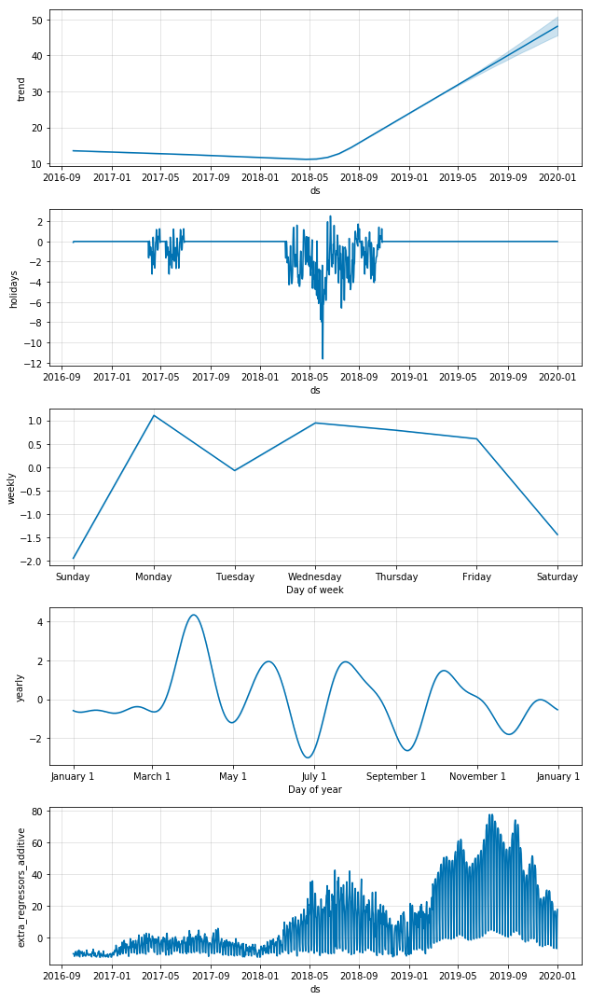

In [97]:
forecast3 = m2.predict(roof_future)
fig3 = m2.plot_components(forecast3)

In [98]:
py.init_notebook_mode()

fig_plotly3 = plot_plotly(m2, forecast3)
py.iplot(fig_plotly3)

In [99]:
forecast3_norm = forecast3.copy()
# (UNDONE) forecast3_norm[['yhat','yhat_lower','yhat_upper']] = np.exp(forecast3_norm[['yhat','yhat_lower','yhat_upper']])
roof_hist_norm = roof_hist.copy()
# (UNDONE) roof_hist_norm['y'] = np.exp(roof_hist_norm['y'])

print('RMSE: %f' % np.sqrt(np.mean((forecast3_norm.loc[:878, 'yhat']-roof_hist_norm['y'])**2)) )

RMSE: 5.338279


In [100]:
# Return only future data
forecast_only_roof = forecast3[forecast3['ds']>'2019-03-01']
forecast_only_roof1 = forecast_only_roof[['ds','yhat']]
forecast_only_roof1.rename(columns = {'yhat':'y'},inplace = True)

/Users/chrismorehouse/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [101]:
# Combine historical 2019 and 2019E data
roof_hist_only = roof_hist[['ds','y']]
frame = [roof_hist_only,forecast_only_roof1]
forecast_19_roof = pd.concat(frame)
forecast_19_roof.tail(), forecast_19_roof.head()

(             ds          y
 1178 2019-12-27  61.240473
 1179 2019-12-28  46.019206
 1180 2019-12-29  38.423161
 1181 2019-12-30  60.059439
 1182 2019-12-31  65.179825,           ds    y
 0 2016-09-29  4.0
 1 2016-09-30  5.0
 2 2016-10-01  3.0
 3 2016-10-02  0.0
 4 2016-10-03  3.0)

In [102]:
forecast_19_roof1 = forecast_19_roof[forecast_19_roof['ds']>'2018-12-31']
forecast_19_roof1.head()

,ds,y
818,2019-01-01,1.0
819,2019-01-02,16.0
820,2019-01-03,30.0
821,2019-01-04,77.0
822,2019-01-05,9.0


/Users/chrismorehouse/anaconda3/lib/python3.6/site-packages/pandas/core/frame.py:4025: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



Text(0,0.5,'Roof Jobs Done')

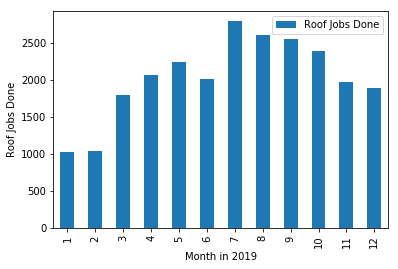

In [103]:
# Group data by month
forecast_19_roof1.rename(columns = {'y':'Roof Jobs Done'},inplace = True)
forecast_19_roof1.groupby(forecast_19_roof1.ds.dt.month).sum().plot(kind='bar')
plt.xlabel('Month in 2019')
plt.ylabel('Roof Jobs Done')

In [104]:
print('Roof Jobs Forecasted in 2019: %f' % forecast_19_roof1[['Roof Jobs Done']].sum() )

Roof Jobs Forecasted in 2019: 24385.713596


# Complete jobs

In [ ]:
complete_jobs2 = pd.merge(regress, complete_jobs1, how='outer', on='ds')
complete_jobs2.tail(), complete_jobs2.head()

In [ ]:
# Create historical and forecast data frames
complete_hist = complete_jobs2[complete_jobs2['ds'] < '2019-03-02']
complete_hist.rename(columns = {'complete':'y'},inplace = True)
complete_hist = complete_hist[['ds','y','reg']]
complete_future = complete_jobs2[['ds','reg']]

In [ ]:
complete_hist.head()

In [ ]:
# Run Prophet on complete jobs with regressor
m3 = Prophet(holidays=weather_window)
m3.add_regressor('reg')
m3.fit(complete_hist)

In [ ]:
forecast4 = m3.predict(complete_future)
fig4 = m3.plot_components(forecast4)

In [ ]:
py.init_notebook_mode()

fig_plotly4 = plot_plotly(m3, forecast4)
py.iplot(fig_plotly4)

In [ ]:
print('RMSE: %f' % np.sqrt(np.mean((forecast4.loc[:878, 'yhat']-complete_hist['y'])**2)) )

In [ ]:
# Return only future data
forecast_only_c = forecast4[forecast4['ds']>'2019-03-01']
forecast_only_c1 = forecast_only_c[['ds','yhat']]
forecast_only_c1.rename(columns = {'yhat':'y'},inplace = True)

In [ ]:
# Combine historical 2019 and 2019E data
c_hist_only = complete_hist[['ds','y']]
frame_c = [c_hist_only,forecast_only_c1]
forecast_19_c = pd.concat(frame_c)
forecast_19_c.tail(), forecast_19_c.head()

In [ ]:
forecast_19_c1 = forecast_19_c[forecast_19_c['ds']>'2018-12-31']
forecast_19_c1.head()

In [ ]:
# Set minimum values to 0 since we can't have negative jobs
forecast_19_c1['y'] = forecast_19_c1['y'].clip(lower = 0)
forecast_19_c1.tail()

In [ ]:
# Group data by month
forecast_19_c1.rename(columns = {'y':'Complete Jobs Done'},inplace = True)
forecast_19_c1.groupby(forecast_19_c1.ds.dt.month).sum().plot(kind='bar')
plt.xlabel('Month in 2019')
plt.ylabel('Complete Jobs Done')

In [ ]:
print('Complete Jobs Forecasted in 2019: %f' % forecast_19_c1[['Complete Jobs Done']].sum() )